In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [2]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import umap
import phate

from External.WS_Tree_dist import EMD_dist_tree_discretized, EMD_dist_tree_edge, plot_flow_discretized
from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp
from External.generation import create_graph

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from numpy.linalg import norm

plt.style.use('standard.mplstyle')

# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"

In [3]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [4]:
PC_to_CC = np.load("../../Data/eth_CC/PC_to_CC.npy")
CA_to_CC = np.load("../../Data/eth_CC/CA_to_CC.npy")

labels = pd.read_csv("~/Data/eth_reduced/obs.csv",header=0)[PC_to_CC]
position = pd.read_csv("~/Data/eth_reduced/X_chronic.csv",header=None)[PC_to_CC]


position = position.to_numpy()
unique_labels = list(labels["annot"].unique())
labels = labels["annot"].to_numpy()

number_of_nodes = len(position)

position.shape

(13707, 4999)

In [5]:
pos = StandardScaler().fit_transform(position)
pca = PCA(n_components=100).fit_transform(pos)

# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))
cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)

sklearn is done: 23.58074402809143
My own part is done: 0.8429708480834961


In [6]:
components = []
for label in unique_labels:
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    components.append(component[0])

sub_ICTs = []
for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    # Only one node -> no graph possible
    if sub_number_of_nodes == 1:
        sub_G = nk.graph.Graph(n=1, weighted=True)
    
    # TODO: might not be the best solution
    elif sub_number_of_nodes <= 6:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=1,
                                beta=2, delta=0.5, bridges=1)
        sub_G.indexEdges()
        
    else:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                                beta=2, delta=0.5, bridges=4)
        sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

update Arr 888 -> 806
added 3 edges early
update Arr 806 -> 731
added 2 edges early
update Arr 731 -> 661
update Arr 661 -> 600
update Arr 600 -> 544
update Arr 544 -> 493
update Arr 493 -> 447
update Arr 447 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 302
update Arr 302 -> 274
update Arr 274 -> 249
update Arr 249 -> 241
update Arr 241 -> 241
update Arr 241 -> 239
update Arr 239 -> 238
update Arr 238 -> 235
added 2 edges early



update Arr 1185 -> 1069
added 6 edges early
update Arr 1069 -> 969
update Arr 969 -> 878
added 2 edges early
update Arr 878 -> 796
added 2 edges early
update Arr 796 -> 723
update Arr 723 -> 654
update Arr 654 -> 594
update Arr 594 -> 538
update Arr 538 -> 489
update Arr 489 -> 443
update Arr 443 -> 398
update Arr 398 -> 360
update Arr 360 -> 327
update Arr 327 -> 325
update Arr 325 -> 324
update Arr 324 -> 323
update Arr 323 -> 318
added 4 edges early
update Arr 318 -> 318
update Arr 318 -> 317



update Arr 1622 -> 1473
added 8 edges early
update Arr 1473 -> 1309
added 3 edges early
update Arr 1309 -> 1186
added 9 edges early
update Arr 1186 -> 1077
added 7 edges early
update Arr 1077 -> 978
added 9 edges early
update Arr 978 -> 889
update Arr 889 -> 806
update Arr 806 -> 732
update Arr 732 -> 664
update Arr 664 -> 603
update Arr 603 -> 548
update Arr 548 -> 498
update Arr 498 -> 449
added 4 edges early
update Arr 449 -> 431
added 7 edges early
update Arr 431 -> 431
update Arr 431 -> 430
update Arr 430 -> 430
update Arr 430 -> 429
update Arr 429 -> 428
update Arr 428 -> 427



update Arr 1087 -> 984
added 3 edges early
update Arr 984 -> 893
added 2 edges early
update Arr 893 -> 810
update Arr 810 -> 730
added 6 edges early
update Arr 730 -> 663
update Arr 663 -> 602
update Arr 602 -> 547
update Arr 547 -> 496
update Arr 496 -> 448
update Arr 448 -> 407
update Arr 407 -> 368
update Arr 368 -> 333
update Arr 333 -> 302
added 4 edges early
update Arr 302 -> 302
update Arr 302 -> 301
update Arr 301 -> 300
update Arr 300 -> 299



update Arr 305 -> 272
update Arr 272 -> 246
update Arr 246 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 94
update Arr 94 -> 93
update Arr 93 -> 90
update Arr 90 -> 89
update Arr 89 -> 88
update Arr 88 -> 87



update Arr 201 -> 182
update Arr 182 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 120
update Arr 120 -> 108
update Arr 108 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 71
update Arr 71 -> 70
update Arr 70 -> 70
update Arr 70 -> 68
update Arr 68 -> 65
update Arr 65 -> 65
update Arr 65 -> 63



update Arr 179 -> 154
update Arr 154 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
update Arr 57 -> 54
update Arr 54 -> 54
update Arr 54 -> 53



update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 15
update Arr 15 -> 14
update Arr 14 -> 14



update Arr 1235 -> 1115
added 6 edges early
update Arr 1115 -> 1007
added 2 edges early
update Arr 1007 -> 913
added 3 edges early
update Arr 913 -> 825
added 4 edges early
update Arr 825 -> 749
update Arr 749 -> 679
update Arr 679 -> 616
update Arr 616 -> 558
update Arr 558 -> 507
update Arr 507 -> 460
update Arr 460 -> 417
update Arr 417 -> 378
update Arr 378 -> 341
update Arr 341 -> 334
update Arr 334 -> 328
added 3 edges early
update Arr 328 -> 328
update Arr 328 -> 327
update Arr 327 -> 326



update Arr 462 -> 418
update Arr 418 -> 375
update Arr 375 -> 339
update Arr 339 -> 307
update Arr 307 -> 277
update Arr 277 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 185
update Arr 185 -> 167
update Arr 167 -> 149
update Arr 149 -> 139
update Arr 139 -> 138
update Arr 138 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 132
update Arr 132 -> 131
update Arr 131 -> 130



update Arr 3 -> 3
added 2 edges early



update Arr 1899 -> 1715
added 15 edges early
update Arr 1715 -> 1554
added 2 edges early
update Arr 1554 -> 1403
added 2 edges early
update Arr 1403 -> 1275
added 6 edges early
update Arr 1275 -> 1144
added 6 edges early
update Arr 1144 -> 1039
update Arr 1039 -> 943
update Arr 943 -> 857
update Arr 857 -> 777
update Arr 777 -> 705
update Arr 705 -> 640
update Arr 640 -> 578
update Arr 578 -> 524
update Arr 524 -> 504
added 3 edges early
update Arr 504 -> 504
update Arr 504 -> 503
update Arr 503 -> 503
update Arr 503 -> 500
update Arr 500 -> 500
update Arr 500 -> 499



update Arr 33 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 12
update Arr 12 -> 11



update Arr 765 -> 692
added 3 edges early
update Arr 692 -> 627
update Arr 627 -> 550
update Arr 550 -> 499
update Arr 499 -> 453
update Arr 453 -> 410
update Arr 410 -> 371
update Arr 371 -> 337
update Arr 337 -> 304
update Arr 304 -> 275
update Arr 275 -> 248
update Arr 248 -> 225
update Arr 225 -> 217
update Arr 217 -> 216
update Arr 216 -> 214
update Arr 214 -> 211
update Arr 211 -> 211
update Arr 211 -> 210
update Arr 210 -> 209



update Arr 526 -> 475
added 4 edges early
update Arr 475 -> 427
update Arr 427 -> 386
added 2 edges early
update Arr 386 -> 350
update Arr 350 -> 317
added 3 edges early
update Arr 317 -> 288
update Arr 288 -> 259
update Arr 259 -> 234
update Arr 234 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 155
update Arr 155 -> 155
update Arr 155 -> 154
update Arr 154 -> 152
update Arr 152 -> 151
update Arr 151 -> 146
added 4 edges early
update Arr 146 -> 146



update Arr 519 -> 446
added 5 edges early
update Arr 446 -> 397
update Arr 397 -> 359
update Arr 359 -> 326
added 2 edges early
update Arr 326 -> 296
update Arr 296 -> 269
update Arr 269 -> 242
update Arr 242 -> 218
update Arr 218 -> 197
added 3 edges early
update Arr 197 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 145
update Arr 145 -> 143
update Arr 143 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 138
update Arr 138 -> 138



update Arr 853 -> 768
added 7 edges early
update Arr 768 -> 698
update Arr 698 -> 632
added 2 edges early
update Arr 632 -> 573
update Arr 573 -> 520
update Arr 520 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 348
update Arr 348 -> 316
update Arr 316 -> 286
update Arr 286 -> 258
update Arr 258 -> 237
update Arr 237 -> 232
update Arr 232 -> 232
update Arr 232 -> 231
update Arr 231 -> 230
update Arr 230 -> 229
update Arr 229 -> 228



update Arr 581 -> 525
added 2 edges early
update Arr 525 -> 476
update Arr 476 -> 424
update Arr 424 -> 383
update Arr 383 -> 346
update Arr 346 -> 312
update Arr 312 -> 280
update Arr 280 -> 254
update Arr 254 -> 230
update Arr 230 -> 207
update Arr 207 -> 188
update Arr 188 -> 171
update Arr 171 -> 170
update Arr 170 -> 166
update Arr 166 -> 166
update Arr 166 -> 165
update Arr 165 -> 164
update Arr 164 -> 162



update Arr 403 -> 364
update Arr 364 -> 329
update Arr 329 -> 298
added 2 edges early
update Arr 298 -> 270
update Arr 270 -> 245
update Arr 245 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 162
update Arr 162 -> 144
update Arr 144 -> 130
update Arr 130 -> 122
update Arr 122 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 115
update Arr 115 -> 114



update Arr 516 -> 464
added 2 edges early
update Arr 464 -> 420
update Arr 420 -> 377
update Arr 377 -> 342
update Arr 342 -> 309
update Arr 309 -> 279
update Arr 279 -> 253
update Arr 253 -> 228
update Arr 228 -> 207
update Arr 207 -> 187
update Arr 187 -> 166
added 2 edges early
update Arr 166 -> 151
update Arr 151 -> 151
update Arr 151 -> 149
update Arr 149 -> 148
update Arr 148 -> 143
added 3 edges early
update Arr 143 -> 143



update Arr 323 -> 281
added 3 edges early
update Arr 281 -> 255
update Arr 255 -> 230
update Arr 230 -> 209
update Arr 209 -> 188
update Arr 188 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 101
update Arr 101 -> 100
update Arr 100 -> 99
update Arr 99 -> 98
update Arr 98 -> 96
update Arr 96 -> 93
update Arr 93 -> 93



update Arr 1493 -> 1346
added 4 edges early
update Arr 1346 -> 1199
update Arr 1199 -> 1089
added 4 edges early
update Arr 1089 -> 980
added 6 edges early
update Arr 980 -> 890
update Arr 890 -> 807
update Arr 807 -> 733
update Arr 733 -> 664
update Arr 664 -> 603
update Arr 603 -> 548
update Arr 548 -> 497
update Arr 497 -> 449
update Arr 449 -> 408
update Arr 408 -> 400
added 6 edges early
update Arr 400 -> 400
update Arr 400 -> 399
update Arr 399 -> 398



update Arr 1 -> 1



update Arr 282 -> 255
update Arr 255 -> 230
update Arr 230 -> 209
update Arr 209 -> 188
update Arr 188 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 88
update Arr 88 -> 88
update Arr 88 -> 86
update Arr 86 -> 84
update Arr 84 -> 82
update Arr 82 -> 80
update Arr 80 -> 79



update Arr 436 -> 390
added 2 edges early
update Arr 390 -> 344
update Arr 344 -> 306
added 3 edges early
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 228
update Arr 228 -> 207
update Arr 207 -> 185
update Arr 185 -> 168
update Arr 168 -> 149
update Arr 149 -> 132
update Arr 132 -> 130
update Arr 130 -> 130
update Arr 130 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 125



update Arr 1253 -> 1128
added 4 edges early
update Arr 1128 -> 1024
added 2 edges early
update Arr 1024 -> 928
added 4 edges early
update Arr 928 -> 843
update Arr 843 -> 766
update Arr 766 -> 695
update Arr 695 -> 631
update Arr 631 -> 572
update Arr 572 -> 515
update Arr 515 -> 468
update Arr 468 -> 423
update Arr 423 -> 384
update Arr 384 -> 349
update Arr 349 -> 342
update Arr 342 -> 342
update Arr 342 -> 340
update Arr 340 -> 339
update Arr 339 -> 338
update Arr 338 -> 337
update Arr 337 -> 336
update Arr 336 -> 335



update Arr 492 -> 441
update Arr 441 -> 399
update Arr 399 -> 354
update Arr 354 -> 320
update Arr 320 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 140
update Arr 140 -> 138
update Arr 138 -> 136



update Arr 2110 -> 1906
added 13 edges early
update Arr 1906 -> 1722
added 3 edges early
update Arr 1722 -> 1565
added 3 edges early
update Arr 1565 -> 1419
added 7 edges early
update Arr 1419 -> 1289
update Arr 1289 -> 1170
update Arr 1170 -> 1063
update Arr 1063 -> 965
update Arr 965 -> 875
update Arr 875 -> 791
update Arr 791 -> 719
update Arr 719 -> 653
update Arr 653 -> 593
update Arr 593 -> 566
added 8 edges early
update Arr 566 -> 566
update Arr 566 -> 565
update Arr 565 -> 564
update Arr 564 -> 564
update Arr 564 -> 563
update Arr 563 -> 562
update Arr 562 -> 561



update Arr 418 -> 377
added 2 edges early
update Arr 377 -> 340
update Arr 340 -> 298
update Arr 298 -> 270
update Arr 270 -> 244
update Arr 244 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 160
update Arr 160 -> 144
update Arr 144 -> 129
update Arr 129 -> 123
added 2 edges early
update Arr 123 -> 123
update Arr 123 -> 122
update Arr 122 -> 121
update Arr 121 -> 119



update Arr 831 -> 754
added 2 edges early
update Arr 754 -> 667
added 3 edges early
update Arr 667 -> 605
update Arr 605 -> 531
added 2 edges early
update Arr 531 -> 482
update Arr 482 -> 438
update Arr 438 -> 397
update Arr 397 -> 360
update Arr 360 -> 326
update Arr 326 -> 296
update Arr 296 -> 269
update Arr 269 -> 244
update Arr 244 -> 239
update Arr 239 -> 239
update Arr 239 -> 237
update Arr 237 -> 235
update Arr 235 -> 234
update Arr 234 -> 233
update Arr 233 -> 230
update Arr 230 -> 230



update Arr 914 -> 812
added 5 edges early
update Arr 812 -> 735
added 2 edges early
update Arr 735 -> 661
update Arr 661 -> 600
added 3 edges early
update Arr 600 -> 545
update Arr 545 -> 493
update Arr 493 -> 448
update Arr 448 -> 407
update Arr 407 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 275
update Arr 275 -> 255
update Arr 255 -> 255
update Arr 255 -> 254
update Arr 254 -> 252
update Arr 252 -> 250
update Arr 250 -> 249
update Arr 249 -> 248
update Arr 248 -> 247



update Arr 1 -> 1



update Arr 777 -> 704
added 5 edges early
update Arr 704 -> 635
added 2 edges early
update Arr 635 -> 573
added 2 edges early
update Arr 573 -> 520
added 3 edges early
update Arr 520 -> 472
update Arr 472 -> 429
update Arr 429 -> 389
update Arr 389 -> 352
update Arr 352 -> 316
update Arr 316 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 215
added 5 edges early
update Arr 215 -> 215
update Arr 215 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212
update Arr 212 -> 212



update Arr 792 -> 716
added 2 edges early
update Arr 716 -> 650
added 3 edges early
update Arr 650 -> 590
update Arr 590 -> 536
update Arr 536 -> 486
update Arr 486 -> 440
update Arr 440 -> 399
update Arr 399 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 268
update Arr 268 -> 242
update Arr 242 -> 225
added 3 edges early
update Arr 225 -> 225
update Arr 225 -> 224
update Arr 224 -> 223
update Arr 223 -> 223
update Arr 223 -> 222



update Arr 208 -> 188
added 2 edges early
update Arr 188 -> 169
update Arr 169 -> 144
update Arr 144 -> 129
update Arr 129 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 58



update Arr 498 -> 450
update Arr 450 -> 402
update Arr 402 -> 363
update Arr 363 -> 329
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 200
update Arr 200 -> 180
update Arr 180 -> 160
update Arr 160 -> 151
added 4 edges early
update Arr 151 -> 151
update Arr 151 -> 150
update Arr 150 -> 150
update Arr 150 -> 148
update Arr 148 -> 147
update Arr 147 -> 145



update Arr 728 -> 660
added 3 edges early
update Arr 660 -> 588
update Arr 588 -> 525
update Arr 525 -> 473
update Arr 473 -> 429
update Arr 429 -> 389
update Arr 389 -> 353
update Arr 353 -> 319
update Arr 319 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 206
update Arr 206 -> 206
update Arr 206 -> 205
update Arr 205 -> 204
update Arr 204 -> 202
update Arr 202 -> 201
update Arr 201 -> 200
update Arr 200 -> 199



update Arr 774 -> 696
added 6 edges early
update Arr 696 -> 630
added 2 edges early
update Arr 630 -> 569
added 3 edges early
update Arr 569 -> 517
update Arr 517 -> 469
update Arr 469 -> 426
update Arr 426 -> 387
update Arr 387 -> 351
update Arr 351 -> 317
update Arr 317 -> 285
update Arr 285 -> 257
update Arr 257 -> 232
update Arr 232 -> 217
update Arr 217 -> 217
update Arr 217 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 208
added 4 edges early
update Arr 208 -> 208



update Arr 528 -> 477
added 7 edges early
update Arr 477 -> 432
update Arr 432 -> 388
added 2 edges early
update Arr 388 -> 351
update Arr 351 -> 316
update Arr 316 -> 286
update Arr 286 -> 259
update Arr 259 -> 235
update Arr 235 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 161
update Arr 161 -> 156
added 3 edges early
update Arr 156 -> 156
update Arr 156 -> 155
update Arr 155 -> 154



update Arr 510 -> 463
added 2 edges early
update Arr 463 -> 416
added 2 edges early
update Arr 416 -> 369
update Arr 369 -> 326
update Arr 326 -> 295
update Arr 295 -> 267
update Arr 267 -> 241
update Arr 241 -> 217
update Arr 217 -> 197
update Arr 197 -> 179
update Arr 179 -> 162
update Arr 162 -> 151
update Arr 151 -> 150
update Arr 150 -> 148
update Arr 148 -> 147
update Arr 147 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143



update Arr 1423 -> 1272
added 5 edges early
update Arr 1272 -> 1152
added 2 edges early
update Arr 1152 -> 1045
added 5 edges early
update Arr 1045 -> 945
added 2 edges early
update Arr 945 -> 859
update Arr 859 -> 780
update Arr 780 -> 707
update Arr 707 -> 641
update Arr 641 -> 581
update Arr 581 -> 527
update Arr 527 -> 478
update Arr 478 -> 434
update Arr 434 -> 394
added 3 edges early
update Arr 394 -> 394
update Arr 394 -> 393
update Arr 393 -> 392
update Arr 392 -> 391
update Arr 391 -> 388
update Arr 388 -> 388
update Arr 388 -> 387



update Arr 989 -> 892
added 3 edges early
update Arr 892 -> 798
update Arr 798 -> 723
added 2 edges early
update Arr 723 -> 640
added 3 edges early
update Arr 640 -> 569
added 4 edges early
update Arr 569 -> 516
update Arr 516 -> 469
update Arr 469 -> 425
update Arr 425 -> 386
update Arr 386 -> 350
update Arr 350 -> 316
update Arr 316 -> 287
update Arr 287 -> 274
update Arr 274 -> 271
added 2 edges early
update Arr 271 -> 271
update Arr 271 -> 266
added 4 edges early
update Arr 266 -> 266



update Arr 589 -> 516
added 3 edges early
update Arr 516 -> 467
update Arr 467 -> 416
added 2 edges early
update Arr 416 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 282
update Arr 282 -> 256
update Arr 256 -> 231
update Arr 231 -> 209
update Arr 209 -> 186
update Arr 186 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 167
update Arr 167 -> 166
update Arr 166 -> 165
update Arr 165 -> 163



update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 18



update Arr 229 -> 206
added 2 edges early
update Arr 206 -> 183
update Arr 183 -> 164
update Arr 164 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 98
update Arr 98 -> 83
added 3 edges early
update Arr 83 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 70
update Arr 70 -> 69
update Arr 69 -> 68



update Arr 985 -> 889
added 4 edges early
update Arr 889 -> 803
update Arr 803 -> 726
update Arr 726 -> 653
update Arr 653 -> 592
update Arr 592 -> 538
update Arr 538 -> 489
update Arr 489 -> 444
update Arr 444 -> 403
update Arr 403 -> 366
update Arr 366 -> 332
update Arr 332 -> 300
update Arr 300 -> 279
update Arr 279 -> 278
update Arr 278 -> 277
update Arr 277 -> 276
update Arr 276 -> 274
update Arr 274 -> 274
update Arr 274 -> 273
update Arr 273 -> 272
update Arr 272 -> 271
update Arr 271 -> 270



update Arr 342 -> 310
added 3 edges early
update Arr 310 -> 269
update Arr 269 -> 243
update Arr 243 -> 219
update Arr 219 -> 199
update Arr 199 -> 180
update Arr 180 -> 161
update Arr 161 -> 144
update Arr 144 -> 128
update Arr 128 -> 113
update Arr 113 -> 107
update Arr 107 -> 106
update Arr 106 -> 104
update Arr 104 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 99
update Arr 99 -> 98



update Arr 871 -> 788
added 4 edges early
update Arr 788 -> 708
update Arr 708 -> 641
update Arr 641 -> 579
added 3 edges early
update Arr 579 -> 526
update Arr 526 -> 477
update Arr 477 -> 432
update Arr 432 -> 392
update Arr 392 -> 354
update Arr 354 -> 320
update Arr 320 -> 289
update Arr 289 -> 262
update Arr 262 -> 247
added 3 edges early
update Arr 247 -> 247
update Arr 247 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242
update Arr 242 -> 241
update Arr 241 -> 240
update Arr 240 -> 239



update Arr 375 -> 332
added 5 edges early
update Arr 332 -> 296
update Arr 296 -> 268
update Arr 268 -> 243
update Arr 243 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 117
update Arr 117 -> 113
update Arr 113 -> 111
update Arr 111 -> 108
update Arr 108 -> 105
update Arr 105 -> 105
update Arr 105 -> 104



update Arr 482 -> 438
added 2 edges early
update Arr 438 -> 392
update Arr 392 -> 354
added 2 edges early
update Arr 354 -> 321
update Arr 321 -> 290
update Arr 290 -> 263
update Arr 263 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 176
update Arr 176 -> 158
update Arr 158 -> 145
update Arr 145 -> 143
update Arr 143 -> 140
update Arr 140 -> 140
update Arr 140 -> 139
update Arr 139 -> 138
update Arr 138 -> 136



update Arr 412 -> 373
added 4 edges early
update Arr 373 -> 337
update Arr 337 -> 300
update Arr 300 -> 272
update Arr 272 -> 247
update Arr 247 -> 223
update Arr 223 -> 200
update Arr 200 -> 181
update Arr 181 -> 163
update Arr 163 -> 147
update Arr 147 -> 131
update Arr 131 -> 118
added 3 edges early
update Arr 118 -> 118
update Arr 118 -> 117
update Arr 117 -> 117
update Arr 117 -> 115
update Arr 115 -> 114
update Arr 114 -> 114



update Arr 275 -> 246
update Arr 246 -> 221
update Arr 221 -> 198
update Arr 198 -> 171
update Arr 171 -> 155
update Arr 155 -> 139
update Arr 139 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 84
update Arr 84 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
update Arr 80 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 76



update Arr 195 -> 174
added 4 edges early
update Arr 174 -> 156
update Arr 156 -> 130
update Arr 130 -> 117
update Arr 117 -> 103
update Arr 103 -> 91
update Arr 91 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
update Arr 60 -> 59
update Arr 59 -> 58
update Arr 58 -> 57



update Arr 803 -> 725
added 5 edges early
update Arr 725 -> 658
update Arr 658 -> 598
added 3 edges early
update Arr 598 -> 540
added 2 edges early
update Arr 540 -> 488
update Arr 488 -> 443
update Arr 443 -> 401
update Arr 401 -> 363
update Arr 363 -> 328
update Arr 328 -> 296
update Arr 296 -> 267
update Arr 267 -> 242
update Arr 242 -> 226
update Arr 226 -> 225
update Arr 225 -> 221
added 3 edges early
update Arr 221 -> 221
update Arr 221 -> 220
update Arr 220 -> 219



update Arr 1095 -> 993
added 6 edges early
update Arr 993 -> 902
update Arr 902 -> 819
added 3 edges early
update Arr 819 -> 741
added 3 edges early
update Arr 741 -> 673
update Arr 673 -> 611
update Arr 611 -> 555
update Arr 555 -> 504
update Arr 504 -> 458
update Arr 458 -> 416
update Arr 416 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 304
update Arr 304 -> 304
update Arr 304 -> 303
update Arr 303 -> 296
added 5 edges early
update Arr 296 -> 296
update Arr 296 -> 295



update Arr 485 -> 439
update Arr 439 -> 399
update Arr 399 -> 359
update Arr 359 -> 325
update Arr 325 -> 293
update Arr 293 -> 264
update Arr 264 -> 239
update Arr 239 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 156
update Arr 156 -> 149
update Arr 149 -> 148
update Arr 148 -> 147
update Arr 147 -> 145
update Arr 145 -> 140
added 2 edges early
update Arr 140 -> 140
update Arr 140 -> 139



update Arr 1 -> 1



update Arr 450 -> 393
added 3 edges early
update Arr 393 -> 349
update Arr 349 -> 316
update Arr 316 -> 281
added 2 edges early
update Arr 281 -> 254
update Arr 254 -> 230
update Arr 230 -> 208
update Arr 208 -> 189
update Arr 189 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 128
update Arr 128 -> 128
update Arr 128 -> 126
update Arr 126 -> 124
update Arr 124 -> 123
update Arr 123 -> 119
update Arr 119 -> 119



update Arr 771 -> 693
added 3 edges early
update Arr 693 -> 628
update Arr 628 -> 564
update Arr 564 -> 512
update Arr 512 -> 465
update Arr 465 -> 420
update Arr 420 -> 381
update Arr 381 -> 346
update Arr 346 -> 314
update Arr 314 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 221
update Arr 221 -> 220
update Arr 220 -> 217
update Arr 217 -> 216
update Arr 216 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212



update Arr 343 -> 308
update Arr 308 -> 279
update Arr 279 -> 247
update Arr 247 -> 224
added 5 edges early
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 102
update Arr 102 -> 99
added 2 edges early
update Arr 99 -> 99
update Arr 99 -> 98



update Arr 1 -> 1



update Arr 951 -> 860
added 4 edges early
update Arr 860 -> 780
added 2 edges early
update Arr 780 -> 706
added 2 edges early
update Arr 706 -> 641
update Arr 641 -> 582
update Arr 582 -> 528
update Arr 528 -> 478
update Arr 478 -> 432
update Arr 432 -> 392
update Arr 392 -> 355
update Arr 355 -> 322
update Arr 322 -> 292
update Arr 292 -> 275
update Arr 275 -> 275
update Arr 275 -> 274
update Arr 274 -> 271
update Arr 271 -> 271
update Arr 271 -> 270
update Arr 270 -> 268
update Arr 268 -> 267
update Arr 267 -> 266



update Arr 1 -> 1



update Arr 568 -> 516
added 4 edges early
update Arr 516 -> 468
update Arr 468 -> 415
update Arr 415 -> 377
update Arr 377 -> 340
update Arr 340 -> 307
update Arr 307 -> 279
update Arr 279 -> 253
update Arr 253 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 168
update Arr 168 -> 168
update Arr 168 -> 167
update Arr 167 -> 167
update Arr 167 -> 161
added 3 edges early
update Arr 161 -> 161
update Arr 161 -> 160
update Arr 160 -> 160



update Arr 918 -> 832
added 4 edges early
update Arr 832 -> 747
update Arr 747 -> 679
update Arr 679 -> 607
added 2 edges early
update Arr 607 -> 551
update Arr 551 -> 499
update Arr 499 -> 453
update Arr 453 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 305
update Arr 305 -> 275
update Arr 275 -> 251
update Arr 251 -> 250
update Arr 250 -> 245
update Arr 245 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242



update Arr 192 -> 166
added 2 edges early
update Arr 166 -> 148
update Arr 148 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 67
update Arr 67 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
update Arr 59 -> 59
update Arr 59 -> 58



update Arr 440 -> 398
added 3 edges early
update Arr 398 -> 354
update Arr 354 -> 312
update Arr 312 -> 279
added 2 edges early
update Arr 279 -> 253
update Arr 253 -> 229
update Arr 229 -> 207
update Arr 207 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 135
update Arr 135 -> 133
update Arr 133 -> 129
added 3 edges early
update Arr 129 -> 129
update Arr 129 -> 128



update Arr 78 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 23



update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 14



update Arr 348 -> 314
update Arr 314 -> 280
update Arr 280 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 109
update Arr 109 -> 108
update Arr 108 -> 108
update Arr 108 -> 107
update Arr 107 -> 106
update Arr 106 -> 106
update Arr 106 -> 105
update Arr 105 -> 104



update Arr 466 -> 421
update Arr 421 -> 369
update Arr 369 -> 331
update Arr 331 -> 300
update Arr 300 -> 272
update Arr 272 -> 245
update Arr 245 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 148
update Arr 148 -> 142
update Arr 142 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 139
update Arr 139 -> 135
added 2 edges early
update Arr 135 -> 135
update Arr 135 -> 134



update Arr 801 -> 717
added 2 edges early
update Arr 717 -> 651
update Arr 651 -> 589
added 2 edges early
update Arr 589 -> 535
update Arr 535 -> 485
update Arr 485 -> 440
update Arr 440 -> 398
update Arr 398 -> 361
update Arr 361 -> 327
update Arr 327 -> 297
update Arr 297 -> 266
update Arr 266 -> 241
update Arr 241 -> 227
update Arr 227 -> 222
update Arr 222 -> 222
update Arr 222 -> 221
update Arr 221 -> 220
update Arr 220 -> 220
update Arr 220 -> 219



update Arr 316 -> 281
update Arr 281 -> 254
update Arr 254 -> 230
update Arr 230 -> 208
update Arr 208 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 101
added 3 edges early
update Arr 101 -> 101
update Arr 101 -> 99
update Arr 99 -> 98
update Arr 98 -> 97
update Arr 97 -> 96
update Arr 96 -> 93



update Arr 185 -> 163
update Arr 163 -> 143
update Arr 143 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 56
update Arr 56 -> 55
update Arr 55 -> 50
update Arr 50 -> 50



update Arr 576 -> 515
added 4 edges early
update Arr 515 -> 465
update Arr 465 -> 418
update Arr 418 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 282
update Arr 282 -> 255
update Arr 255 -> 230
update Arr 230 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 164
update Arr 164 -> 163
update Arr 163 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 157
update Arr 157 -> 156
update Arr 156 -> 155



update Arr 561 -> 507
update Arr 507 -> 453
update Arr 453 -> 407
update Arr 407 -> 368
update Arr 368 -> 332
update Arr 332 -> 300
update Arr 300 -> 272
update Arr 272 -> 246
update Arr 246 -> 221
update Arr 221 -> 200
update Arr 200 -> 177
update Arr 177 -> 166
update Arr 166 -> 157
added 6 edges early
update Arr 157 -> 157
update Arr 157 -> 156



update Arr 675 -> 607
added 5 edges early
update Arr 607 -> 549
update Arr 549 -> 497
added 3 edges early
update Arr 497 -> 450
added 2 edges early
update Arr 450 -> 406
update Arr 406 -> 369
update Arr 369 -> 334
update Arr 334 -> 302
update Arr 302 -> 274
update Arr 274 -> 248
update Arr 248 -> 225
update Arr 225 -> 201
update Arr 201 -> 185
update Arr 185 -> 182
update Arr 182 -> 178
added 3 edges early
update Arr 178 -> 178
update Arr 178 -> 177



update Arr 747 -> 672
added 5 edges early
update Arr 672 -> 596
update Arr 596 -> 541
added 3 edges early
update Arr 541 -> 491
update Arr 491 -> 446
update Arr 446 -> 404
update Arr 404 -> 365
update Arr 365 -> 330
update Arr 330 -> 297
update Arr 297 -> 269
update Arr 269 -> 242
update Arr 242 -> 218
update Arr 218 -> 216
update Arr 216 -> 215
update Arr 215 -> 214
update Arr 214 -> 209
update Arr 209 -> 209
update Arr 209 -> 207



update Arr 317 -> 288
update Arr 288 -> 256
update Arr 256 -> 231
update Arr 231 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 155
update Arr 155 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 101
update Arr 101 -> 101
update Arr 101 -> 100
update Arr 100 -> 100
update Arr 100 -> 97
update Arr 97 -> 96
update Arr 96 -> 95
update Arr 95 -> 94



update Arr 739 -> 665
added 4 edges early
update Arr 665 -> 597
update Arr 597 -> 539
added 3 edges early
update Arr 539 -> 483
update Arr 483 -> 439
update Arr 439 -> 398
update Arr 398 -> 360
update Arr 360 -> 327
update Arr 327 -> 296
update Arr 296 -> 269
update Arr 269 -> 241
update Arr 241 -> 218
update Arr 218 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 209
update Arr 209 -> 208
update Arr 208 -> 206
update Arr 206 -> 204



update Arr 703 -> 628
added 4 edges early
update Arr 628 -> 563
added 3 edges early
update Arr 563 -> 511
added 3 edges early
update Arr 511 -> 464
update Arr 464 -> 421
update Arr 421 -> 382
update Arr 382 -> 347
update Arr 347 -> 314
update Arr 314 -> 285
update Arr 285 -> 259
update Arr 259 -> 235
update Arr 235 -> 210
update Arr 210 -> 194
update Arr 194 -> 194
update Arr 194 -> 192
update Arr 192 -> 191
update Arr 191 -> 190
update Arr 190 -> 188
update Arr 188 -> 187



update Arr 881 -> 799
added 5 edges early
update Arr 799 -> 720
added 2 edges early
update Arr 720 -> 652
added 3 edges early
update Arr 652 -> 592
update Arr 592 -> 538
update Arr 538 -> 489
update Arr 489 -> 442
update Arr 442 -> 398
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 269
update Arr 269 -> 248
update Arr 248 -> 247
update Arr 247 -> 245
update Arr 245 -> 243
update Arr 243 -> 241
update Arr 241 -> 239
update Arr 239 -> 239



update Arr 224 -> 199
added 2 edges early
update Arr 199 -> 178
update Arr 178 -> 156
update Arr 156 -> 140
update Arr 140 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 88
update Arr 88 -> 78
update Arr 78 -> 71
update Arr 71 -> 70
update Arr 70 -> 66
update Arr 66 -> 64
update Arr 64 -> 62
update Arr 62 -> 62



update Arr 2 -> 2



update Arr 1 -> 1



update Arr 320 -> 289
update Arr 289 -> 258
update Arr 258 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 169
update Arr 169 -> 152
update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 103
update Arr 103 -> 100
update Arr 100 -> 100
update Arr 100 -> 99
update Arr 99 -> 98
update Arr 98 -> 97
update Arr 97 -> 96
update Arr 96 -> 94



update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 14
update Arr 14 -> 12
update Arr 12 -> 10
update Arr 10 -> 9
update Arr 9 -> 8



update Arr 561 -> 500
update Arr 500 -> 451
update Arr 451 -> 405
update Arr 405 -> 368
update Arr 368 -> 332
update Arr 332 -> 300
update Arr 300 -> 272
update Arr 272 -> 245
update Arr 245 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 161
update Arr 161 -> 159
update Arr 159 -> 158
update Arr 158 -> 155
update Arr 155 -> 155
update Arr 155 -> 154
update Arr 154 -> 152



update Arr 273 -> 245
update Arr 245 -> 218
update Arr 218 -> 197
added 2 edges early
update Arr 197 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 88
update Arr 88 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
update Arr 84 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 79



In [7]:
lens = []
for component in components:
    lens.append(len(component))

72.0

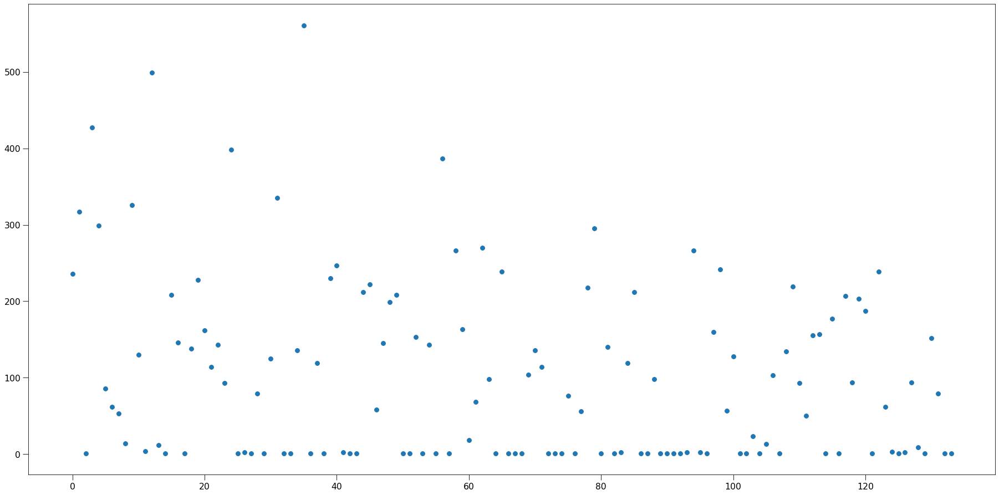

In [8]:
plt.plot(lens)
# plt.ylim(0,5)
np.median(lens)

In [9]:
np.sum(np.array(lens)==1)

45

In [10]:
# calculate the UMAP embedding. In the plots replace position with embedding

pca_100d = PCA(n_components=50).fit_transform(position)

reducer = umap.UMAP(min_dist=0.8)
# scaled_data = StandardScaler().fit_transform(position)
scaled_data = position
embedding = reducer.fit_transform(pca_100d)

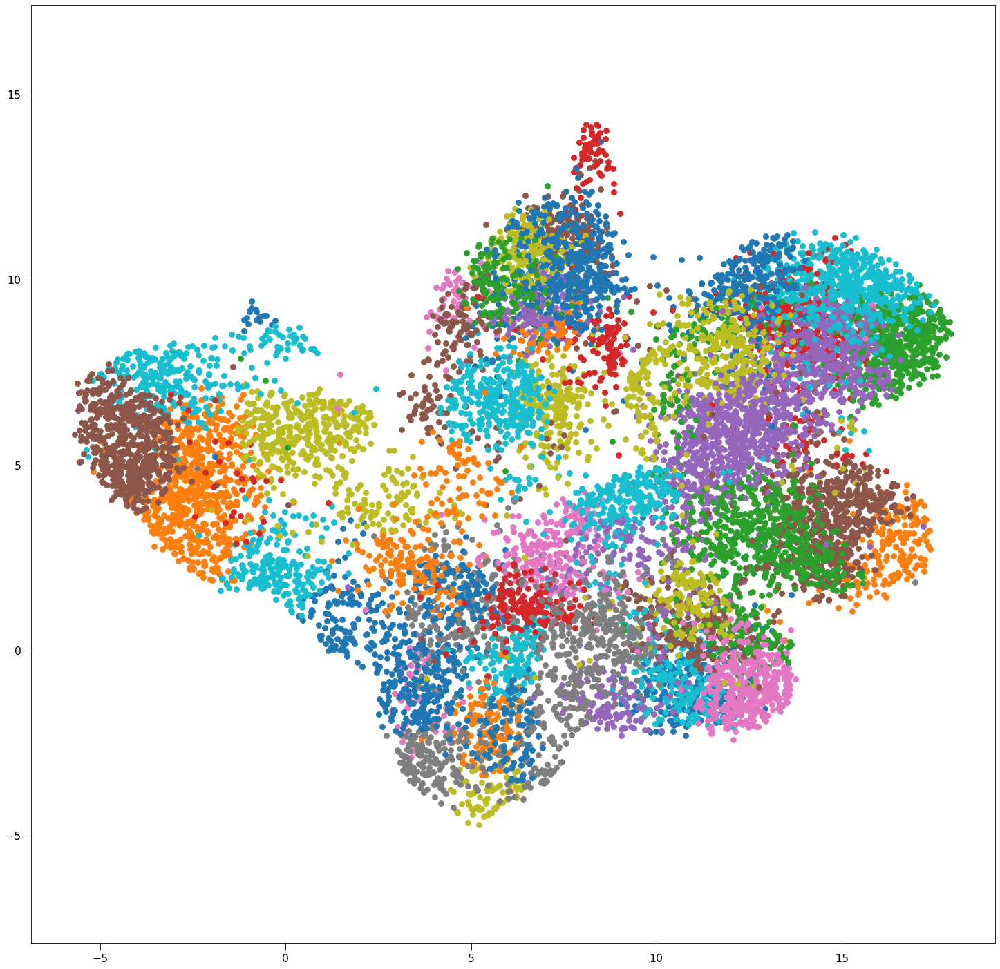

In [11]:
fig, ax = plt.subplots(1, figsize=(24,24))
for label in unique_labels:
    plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
ax.axis("equal")
# plt.legend()
plt.show()

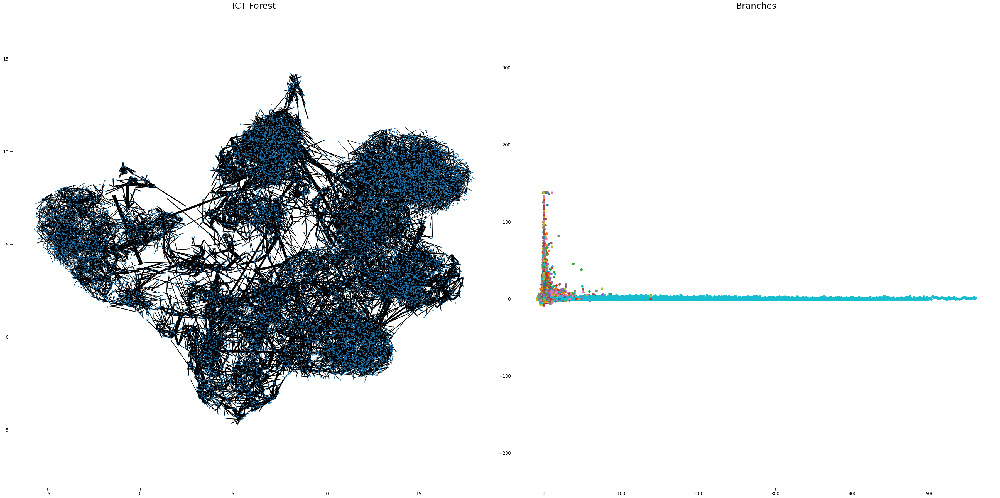

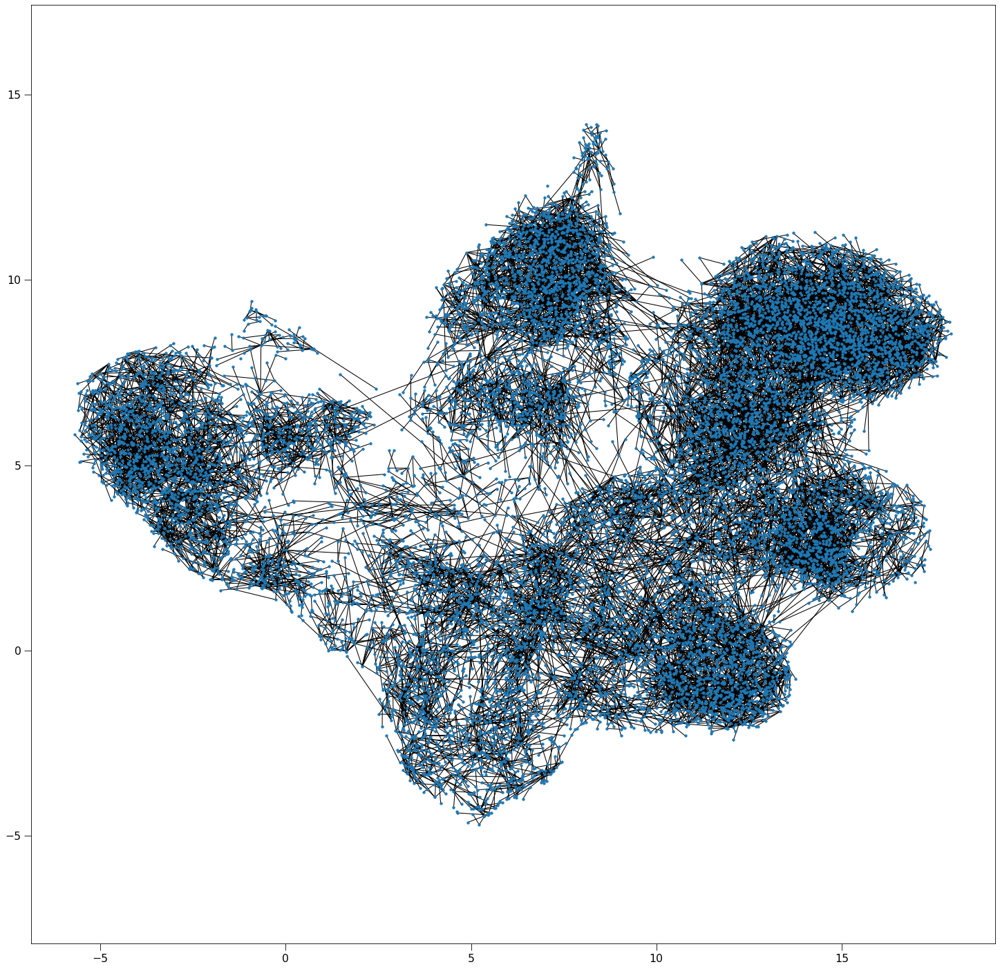

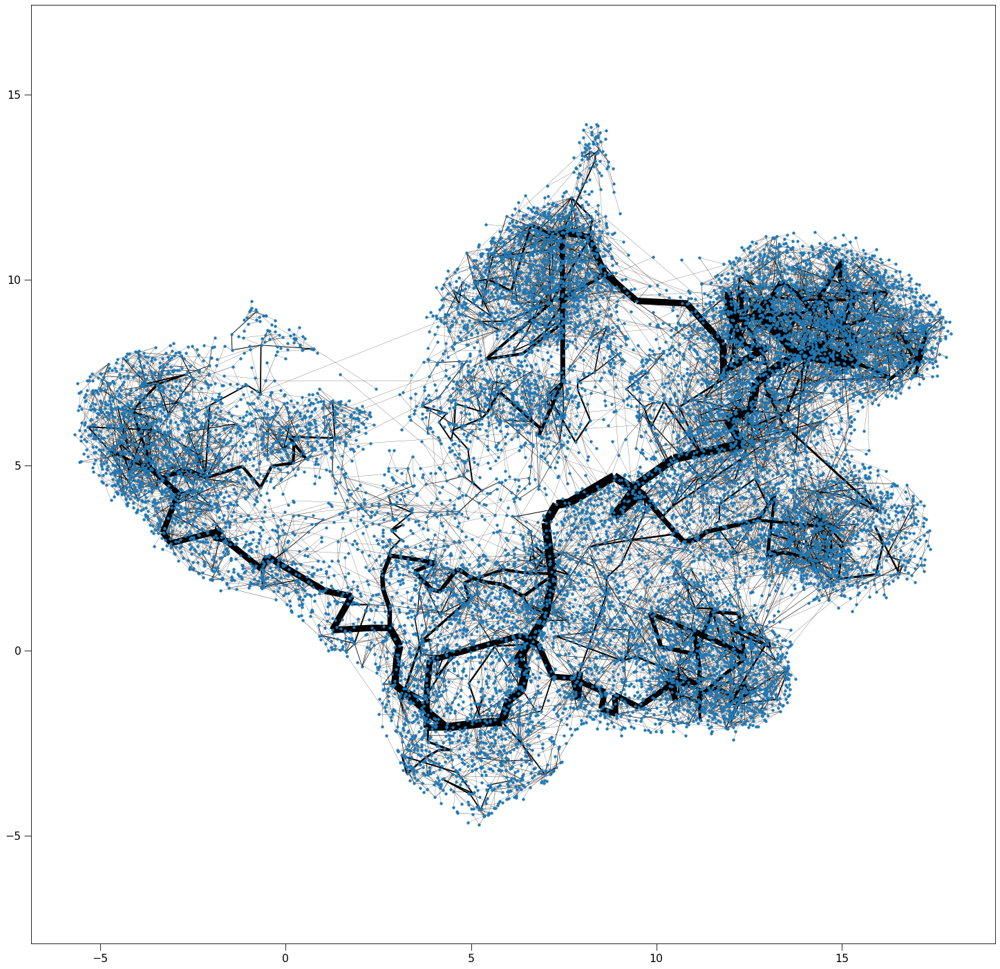

In [12]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*position[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [13]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT_cluster_all = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT_cluster_all.indexEdges()

# widths of the edges
widths_cluster_all = compute_widths(ICT_cluster_all)
print(time.time()-start)

update Arr 13706 -> 13706
added 8950 edges early
added 4755 edges early

3.9457294940948486


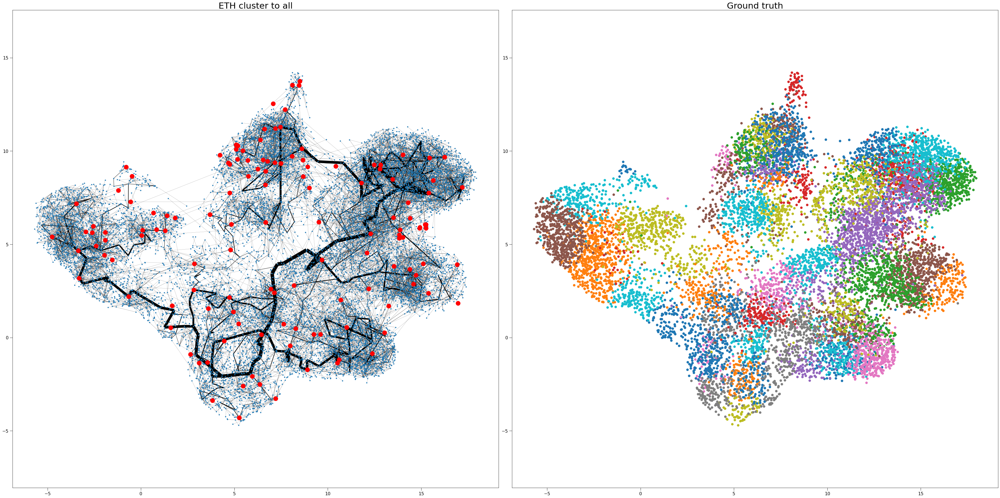

In [14]:
# plotting
graphs = [ICT_cluster_all]
widths = [np.array(widths_cluster_all)]
names = ["ETH cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest")
plt.show()

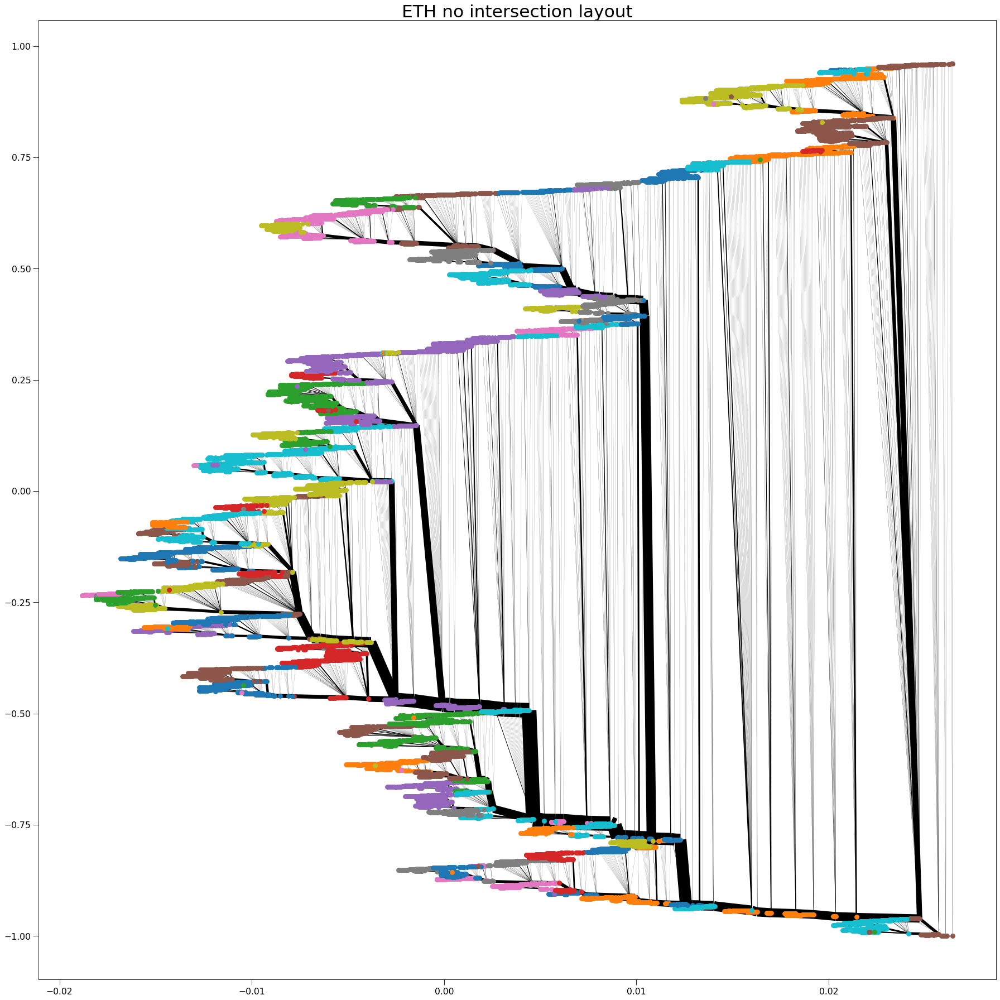

In [15]:
import networkx as nx
from copy import deepcopy
from numpy.linalg import norm
ICT = deepcopy(ICT_cluster_all)

for u, v in ICT.iterEdges():
    ICT.setWeight(u, v, norm(position[u] - position[v]))
    
ICT_nx = nk.nxadapter.nk2nx(ICT)

def arr_to_dict(arr):
    dct = {}
    for idx, elem in tqdm(enumerate(arr), desc="Create a dict from the position array"):
        dct[idx] = elem
    return dct

mapping = nx.planar_layout(ICT_nx)

mapping_ndarray = np.zeros((ICT.upperEdgeIdBound()+1,2))

# print(mapping_ndarray)

for key, val in zip(mapping.keys(), mapping.values()):
#     print(key)
    mapping_ndarray[key] = np.array([-val[1], -val[0]])
    
mapping = mapping_ndarray

# plotting
graphs = [ICT_cluster_all]
widths = [widths_cluster_all]
names = ["ETH no intersection layout", "Empty dataset"]


number_of_plots = 1
fig, ax = plt.subplots(1,1, figsize=(24,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=mapping, ax=ax[i], width=np.array(widths[i])**1.3, node_size=0)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
#         ax[i].plot(*mapping[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
        for label in unique_labels:
            plt.plot(*mapping[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
#     ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest-no-intersections")
plt.show()

# DTAE embedding

In [16]:
DTAE_embedding = pd.read_csv("~/Data/eth/embedding.csv",header=None)

DTAE_embedding = DTAE_embedding.to_numpy()

DTAE_embedding = DTAE_embedding[CA_to_CC]

In [17]:
DTAE_embedding.shape

(13707, 2)

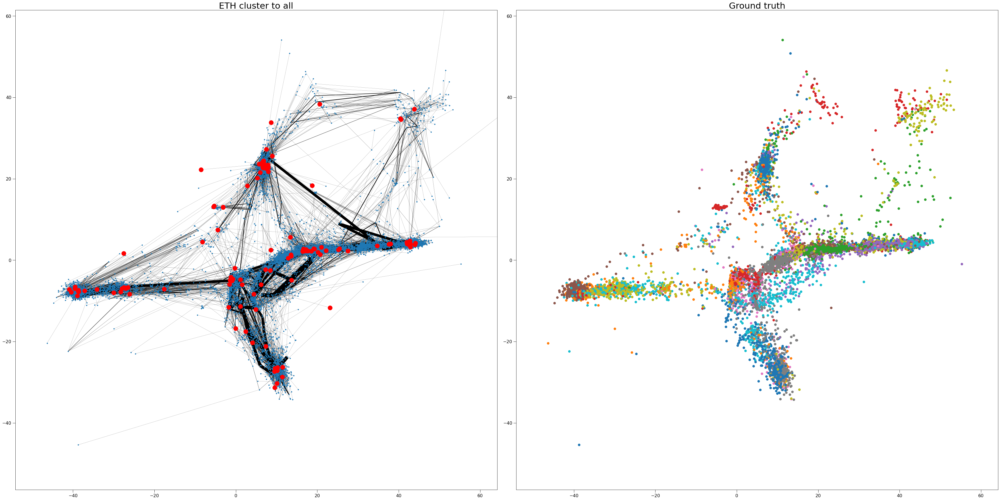

In [18]:
# plotting
graphs = [ICT_cluster_all]
widths = [np.array(widths_cluster_all)]
names = ["ETH cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=DTAE_embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*DTAE_embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*DTAE_embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    ax[i].set_xlim([-50,60])
    ax[i].set_ylim([-45,50])
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest-dtae-layout")
plt.show()